In [58]:
import os
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.resnet50 import decode_predictions
from sklearn.preprocessing import StandardScaler
import umap
from keras.models import Model
# import layers
import keras
from keras.applications.efficientnet_v2 import EfficientNetV2S, preprocess_input
from collections import Counter
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense, Dropout


In [59]:
# Define paths
base_dir = './z3_data/' 
train_dir = os.path.join(base_dir, 'train/')
test_dir = os.path.join(base_dir, 'test/')

In [60]:
def plot_images_from_each_class(train_dir):
    animal_classes = os.listdir(train_dir)
    num_classes = len(animal_classes)
    
    # Set up the grid size
    grid_size = (10, 9)  # 10 rows, 9 columns for 90 classes
    plt.figure(figsize=(15, 15))  # Adjust the size as needed

    for i, animal_class in enumerate(animal_classes):
        class_folder = os.path.join(train_dir, animal_class)
        image_file = os.listdir(class_folder)[0]
        image_path = os.path.join(class_folder, image_file)
        img = plt.imread(image_path)
        
        # Plot in grid
        plt.subplot(grid_size[0], grid_size[1], i+1)  # Grid position
        plt.imshow(img)
        plt.title(animal_class)
        plt.axis('off')  # Hide axis for cleaner look

    plt.tight_layout()
    plt.show()

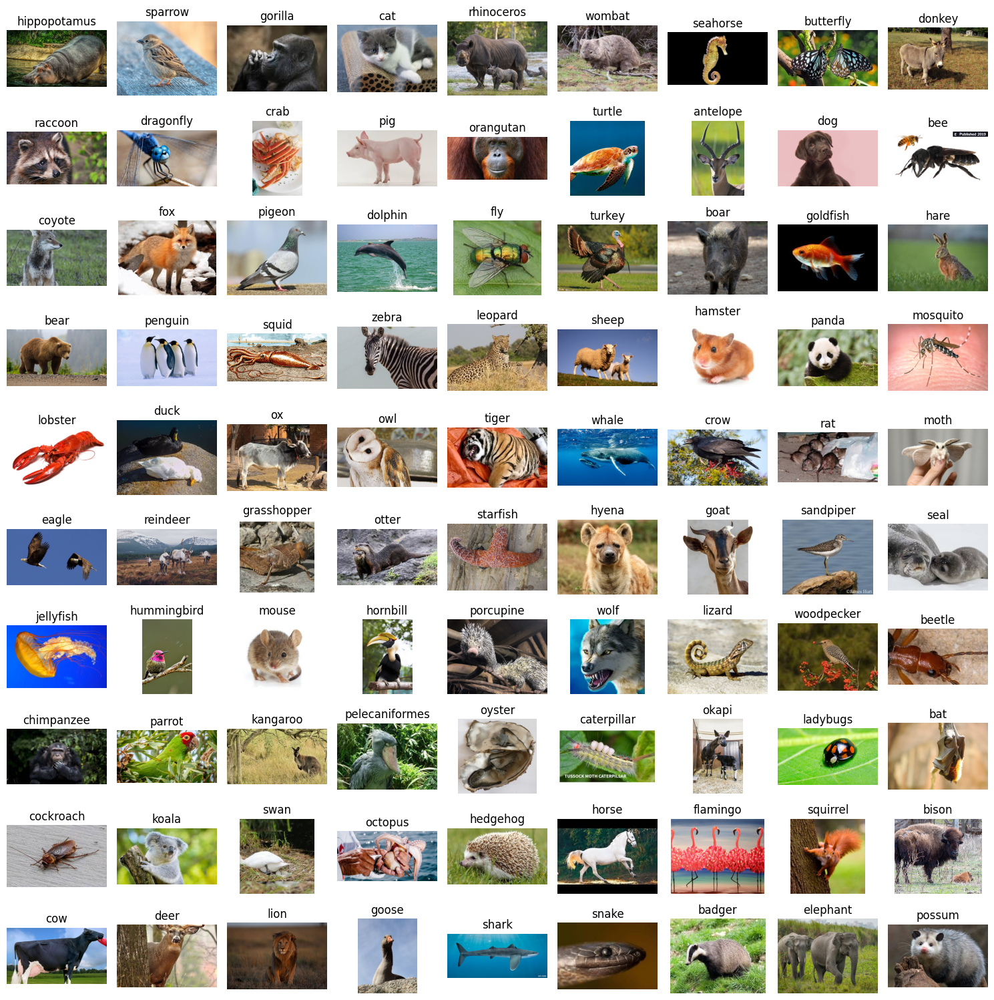

In [61]:
plot_images_from_each_class(train_dir)

In [62]:
image_size = (384, 384)
batch_size = 60
seed = 42

In [63]:
train_generator = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    validation_split=0.1,
    seed=seed,
    image_size=image_size,
    batch_size=batch_size,
    subset='training',
    label_mode='categorical')

Found 4860 files belonging to 90 classes.
Using 4374 files for training.


In [64]:
validation_generator = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(image_size),
    seed=seed,
    batch_size=batch_size,
    subset='validation',
    validation_split=0.1,
    label_mode='categorical')

Found 4860 files belonging to 90 classes.
Using 486 files for validation.


In [65]:
test_generator = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=image_size,
    seed=seed,
    batch_size=batch_size,
    shuffle=False,
    label_mode='categorical')


Found 540 files belonging to 90 classes.


In [66]:
import numpy as np

def accumulate_batches(generator, num_samples, batch_size):
    batch_count = num_samples // batch_size
    x, y = [], []
    count = 0
    for data_batch, labels_batch in generator:
        if count < batch_count:
            x.append(data_batch)
            y.append(labels_batch)
            count += 1
        else:
            break
    return np.vstack(x), np.concatenate(y)

# Assuming 'batch_size' is defined elsewhere in your code
x_train, y_train = accumulate_batches(train_generator, 4860, batch_size)
x_test, y_test = accumulate_batches(test_generator, 540, batch_size)

# Output the shapes
print(f"x_train shape: {x_train.shape} - y_train shape: {y_train.shape}")
print(f"x_test shape: {x_test.shape} - y_test shape: {y_test.shape}")


x_train shape: (4374, 384, 384, 3) - y_train shape: (4374, 90)
x_test shape: (540, 384, 384, 3) - y_test shape: (540, 90)


In [67]:
import numpy as np
from keras.applications.efficientnet_v2 import EfficientNetV2S

# Load the model
model = EfficientNetV2S(weights='imagenet')

# Make predictions
predictions = model.predict(test_generator)

# Extract true labels
true_labels = np.concatenate([y for x, y in test_generator], axis=0)
true_labels_indices = np.argmax(true_labels, axis=1)

9/9 [==============================] - 43s 5s/step


In [68]:
# Assuming true_labels_indices contains the integer indices of the true classes
class_counts = Counter(true_labels_indices)

# Get the class names from the test_generator
class_names = test_generator.class_names

# Map indices to class names
index_to_class = {i: name for i, name in enumerate(class_names)}

# Create a dictionary mapping class names to counts
class_counts_named = {index_to_class[i]: count for i, count in class_counts.items()}

# Convert the dictionary to a pandas DataFrame for pretty printing as a table
class_counts_df = pd.DataFrame(list(class_counts_named.items()), columns=['Class', 'Count'])

# Sort the DataFrame by the class names
class_counts_df = class_counts_df.sort_values('Class')

# Visualize the class counts neatly in a table
print(class_counts_df)


         Class  Count
0     antelope      6
1       badger      6
2          bat      6
3         bear      6
4          bee      6
..         ...    ...
85       whale      6
86        wolf      6
87      wombat      6
88  woodpecker      6
89       zebra      6

[90 rows x 2 columns]


In [69]:
# Decode the top-1 predictions from the model to get the class names
decoded_predictions = decode_predictions(predictions, top=1)
top3_decoded = decode_predictions(predictions, top=3)
top2_decoded = [preds[:2] for preds in top3_decoded]

# Extract the class name from the decoded predictions
predicted_classes_names = [pred[0][1] for pred in decoded_predictions]

# Assuming you have the true class indices and class names from your dataset
true_classes = [class_names[idx] for idx in true_labels_indices]

# Combine the true and predicted class names into a pandas DataFrame
comparison_df = pd.DataFrame({'True': true_classes, 'Predicted': predicted_classes_names})

incorrect_predictions_df = comparison_df[comparison_df['True'] != comparison_df['Predicted']]

most_common_incorrect_predictions = incorrect_predictions_df.groupby('True')['Predicted'].agg(lambda x: x.mode()[0])

def count_confusions(group):
    most_common = group['Predicted'].mode()[0]
    count = sum(group['Predicted'] == most_common)
    return pd.Series([most_common, count], index=['Most Common Incorrect Prediction', 'Confusion Count'])

confusion_counts_df = incorrect_predictions_df.groupby('True').apply(count_confusions).reset_index()

confusion_counts_df

,True,Most Common Incorrect Prediction,Confusion Count
0,antelope,impala,3
1,bat,bath_towel,1
2,bear,brown_bear,4
3,bee,honeycomb,1
4,beetle,ground_beetle,3
...,...,...,...
60,turkey,partridge,2
61,turtle,loggerhead,4
62,whale,grey_whale,4
63,wolf,timber_wolf,6


In [70]:
import pandas as pd

# Assuming 'predictions' is a numpy array with shape (num_samples, num_classes)
# and contains the probability scores for each class

# Decode the top-3 predictions from the model to get the class names along with probabilities
top3_decoded = decode_predictions(predictions, top=3)

# Create a list to store combined predictions and probabilities
combined_predictions = []

# Iterate over each prediction
for top3 in top3_decoded:
    # Extract class names and probabilities
    top1_class, top1_prob = top3[0][1], top3[0][2]
    top2_class, top2_prob = top3[1][1], top3[1][2] if len(top3) > 1 else (None, None)
    top3_class, top3_prob = top3[2][1], top3[2][2] if len(top3) > 2 else (None, None)
    
    # Append to the list
    combined_predictions.append({
        'Top1_Class': top1_class, 'Top1_Probability': top1_prob,
        'Top2_Class': top2_class, 'Top2_Probability': top2_prob,
        'Top3_Class': top3_class, 'Top3_Probability': top3_prob
    })

# Create a DataFrame from the combined predictions
combined_df = pd.DataFrame(combined_predictions)

# Display the head of the DataFrame
print(combined_df.head())


  Top1_Class  Top1_Probability Top2_Class  Top2_Probability  Top3_Class  \
0    gazelle          0.601458     impala          0.275367  hartebeest   
1    gazelle          0.441228     impala          0.378046  hartebeest   
2     impala          0.473843    gazelle          0.381989  hartebeest   
3     impala          0.873692    gazelle          0.041837  hartebeest   
4       hare          0.495717      dhole          0.121664     gazelle   

   Top3_Probability  
0          0.014208  
1          0.032426  
2          0.055949  
3          0.005926  
4          0.070284  


In [71]:
import inflect
import re

p = inflect.engine()

def singularize(word):
    singular_word = p.singular_noun(word)
    return singular_word if singular_word else word


def is_correct_prediction(row):
    # Get the singular form of the true class
    true_class_singular = singularize(row['True'])

    # Define a pattern that matches the true class or its singular form as a part of a compound word
    # The pattern looks for the class name surrounded by word boundaries or underscores
    pattern = r'(?:\b|_)(?:' + re.escape(true_class_singular) + r'|' + re.escape(row['True']) + r')(?:\b|_)'
    return re.search(pattern, row['Predicted']) is not None


comparison_df['IsCorrect'] = comparison_df.apply(is_correct_prediction, axis=1)

incorrect_predictions_df = comparison_df[~comparison_df['IsCorrect']]
confusion_counts_df = incorrect_predictions_df.groupby('True').apply(count_confusions).reset_index()
sorted_confusion_counts_df = confusion_counts_df.sort_values('Confusion Count', ascending=False)
top_5_confusions = sorted_confusion_counts_df.head(10)

top_5_confusions


,True,Most Common Incorrect Prediction,Confusion Count
36,pig,hog,6
23,kangaroo,wallaby,6
48,sparrow,brambling,6
9,cow,ox,6
11,deer,impala,5
45,seal,sea_lion,5
41,reindeer,ibex,5
35,pelecaniformes,pelican,5
21,hedgehog,porcupine,5
28,moth,ringlet,4


In [72]:
def count_correct_predictions(group):
    return pd.Series([len(group)], index=['Correct Predictions Count'])

# Filter for correct predictions
correct_predictions_df = comparison_df[comparison_df['IsCorrect']]

# Count the number of correct predictions for each class
correct_counts_df = correct_predictions_df.groupby('True').apply(count_correct_predictions).reset_index()

# Sort the DataFrame by 'Correct Predictions Count' in descending order
sorted_correct_counts_df = correct_counts_df.sort_values('Correct Predictions Count', ascending=False)

# Get the top 5 classes with the most correct predictions
top_5_correct_classes = sorted_correct_counts_df.head(10)

top_5_correct_classes

# count the number of 6 correct predictions for each class
correct_counts_df = correct_predictions_df.groupby('True').apply(count_correct_predictions).reset_index()

# Sort the DataFrame by 'Correct Predictions Count' in descending order
sorted_correct_counts_df = correct_counts_df.sort_values('Correct Predictions Count', ascending=False)

# Get the top 5 classes with the most correct predictions
top_5_correct_classes = sorted_correct_counts_df.head(10)

top_5_correct_classes


,True,Correct Predictions Count
0,badger,6
37,ox,6
25,hornbill,6
27,hyena,6
28,jellyfish,6
29,koala,6
32,lion,6
33,lobster,6
34,orangutan,6
35,otter,6


In [73]:
def replace_with_true_substrings(true_classes, predicted_classes_names):
    updated_predictions = []

    for pred in predicted_classes_names:
        # Initialize the updated prediction as the original prediction
        updated_pred = pred

        # Check if the prediction contains any of the true class names as a substring
        for true in true_classes:
            if true in pred:
                updated_pred = true
                break  # Stop looking if we found a true class as a substring

        # Add the updated prediction to the list
        updated_predictions.append(updated_pred)

    return updated_predictions

# Use the function to update the predicted class names
updated_predicted_classes_names = replace_with_true_substrings(true_classes, predicted_classes_names)

# Count the number of times the updated predicted class matches the true class
correct_predictions = sum([true == updated_pred for true, updated_pred in zip(true_classes, updated_predicted_classes_names)])

# Calculate the accuracy as the proportion of correct predictions
accuracy = correct_predictions / len(true_classes)

print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.48


In [74]:
from collections import Counter

predicted_counts = Counter(predicted_classes_names)
print("Predicted class distribution:")
for class_name, count in predicted_counts.items():
    print(f"{class_name}: {count}")


Predicted class distribution:
gazelle: 7
impala: 8
hare: 7
badger: 8
cock: 1
howler_monkey: 1
jackfruit: 1
mink: 3
bath_towel: 1
electric_ray: 2
brown_bear: 4
American_black_bear: 1
koala: 7
bee: 5
honeycomb: 1
lacewing: 1
ground_beetle: 3
rhinoceros_beetle: 3
bison: 6
wild_boar: 5
hog: 7
monarch: 2
dragonfly: 4
ringlet: 5
cabbage_butterfly: 1
lycaenid: 2
Egyptian_cat: 4
Siamese_cat: 1
tabby: 1
centipede: 1
tree_frog: 1
isopod: 3
nematode: 3
leaf_beetle: 2
chimpanzee: 6
cricket: 1
cockroach: 5
ox: 14
coyote: 6
rock_crab: 2
fiddler_crab: 2
Dungeness_crab: 2
magpie: 2
black_grouse: 7
coucal: 1
vulture: 3
miniature_poodle: 1
Pembroke: 2
Border_collie: 1
Pomeranian: 1
EntleBucher: 1
grey_whale: 5
great_white_shark: 5
sea_lion: 6
killer_whale: 1
gar: 3
ibex: 9
bighorn: 1
llama: 2
Arabian_camel: 2
damselfly: 3
goose: 14
drake: 2
bald_eagle: 6
Indian_elephant: 3
tusker: 2
African_elephant: 2
flamingo: 6
fly: 8
red_fox: 6
ram: 5
black-footed_ferret: 2
goldfish: 5
tench: 1
gorilla: 6
grasshoppe

In [75]:
# True positives per class (don't use confusion matrix)
true_positives = [0] * len(class_names)
for true_class, predicted_class in zip(true_classes, predicted_classes_names):
    if true_class == predicted_class:
        true_positives[class_names.index(true_class)] += 1


# Map true positives to class names
class_true_positives = dict(zip(class_names, true_positives))

# Determine the class with the most correct predictions
most_correct_class = max(class_true_positives, key=class_true_positives.get)
print(f"Class with most correct predictions: {most_correct_class} ({class_true_positives[most_correct_class]} correct predictions)")


Class with most correct predictions: badger (6 correct predictions)


In [76]:
# Load the model for feature extraction
model = EfficientNetV2S(weights='imagenet', include_top=False)
x = layers.GlobalAveragePooling2D()(model.output)
feature_model = Model(inputs=model.input, outputs=x)

# Data generator for training and testing data
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False)

# Function to extract features and paths
def extract_features_and_paths(generator, model):
    features = []
    labels = []
    paths = []
    for i in range(generator.samples // generator.batch_size):
        x_batch, y_batch = generator.next()
        batch_features = model.predict(x_batch)
        features.extend(batch_features)
        labels.extend(y_batch)
        # Infer file paths
        batch_filenames = generator.filenames[i * generator.batch_size:(i + 1) * generator.batch_size]
        batch_paths = [os.path.join(generator.directory, fname) for fname in batch_filenames]
        paths.extend(batch_paths)
    print(features)
    return np.array(features), np.array(labels), paths

# Extract features and paths
train_features, train_labels, train_paths = extract_features_and_paths(train_generator, feature_model)
test_features, test_labels, test_paths = extract_features_and_paths(test_generator, feature_model)

# Convert to DataFrame
train_df = pd.DataFrame(train_features)
train_df['path'] = train_paths
train_df['label'] = np.argmax(train_labels, axis=1)

test_df = pd.DataFrame(test_features)
test_df['path'] = test_paths
test_df['label'] = np.argmax(test_labels, axis=1)

Found 4860 images belonging to 90 classes.
Found 540 images belonging to 90 classes.
2/2 [==============================] - 5s 2s/step
[array([-0.15761346, -0.11884003,  0.05855271, ..., -0.00606553,
       -0.1778165 ,  0.10617229], dtype=float32), array([-0.1259337 , -0.02793131, -0.18607341, ...,  0.11242232,
       -0.20605496, -0.15291438], dtype=float32), array([-0.11808273, -0.19218206, -0.16061494, ..., -0.08544191,
       -0.20967522, -0.18566857], dtype=float32), array([-0.17755349, -0.10273569, -0.21041328, ...,  0.00030294,
       -0.18031426, -0.11055761], dtype=float32), array([-0.15417781, -0.03440333,  0.02285085, ..., -0.07033166,
       -0.1716667 , -0.06183632], dtype=float32), array([-0.16328561, -0.20030403, -0.07809982, ..., -0.06655256,
       -0.18955679, -0.13292621], dtype=float32), array([-0.15531002, -0.18701851, -0.0921743 , ..., -0.06696349,
       -0.21302503, -0.0940437 ], dtype=float32), array([-0.18221354, -0.18352087, -0.20957747, ...,  0.02277731,
  

In [77]:
train_features = train_df.drop(['path', 'label'], axis=1)
test_features = test_df.drop(['path', 'label'], axis=1)

# standardize the feature vectors
scaler = StandardScaler()
scaler.fit_transform(train_features)
scaler.transform(test_features)

reducer = umap.UMAP(n_components=300)
embedding = reducer.fit_transform(train_features)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [78]:
test_df
# show only  first 10 columns and last 2 columns
test_df.iloc[:, np.r_[0:10, -2, -1]]

,0,1,2,3,4,5,6,7,8,9,path,label
0,-0.207474,0.058204,-0.233357,0.344247,-0.063185,-0.106902,-0.205937,-0.138919,-0.016546,-0.146996,./z3_data/test/antelope/02f4b3be2d.jpg,0
1,-0.218751,-0.135018,-0.158935,0.135577,0.414292,-0.069325,-0.143954,-0.157757,0.023039,-0.147377,./z3_data/test/antelope/058fa9a60f.jpg,0
2,-0.204300,-0.044994,-0.178028,-0.065748,-0.118413,-0.168248,-0.189280,-0.040393,-0.059299,-0.161984,./z3_data/test/antelope/1a3f59ee02.jpg,0
3,-0.206010,0.041227,-0.138948,0.163580,-0.128813,-0.044190,-0.151622,-0.140310,-0.119873,-0.158936,./z3_data/test/antelope/61c60311b5.jpg,0
4,-0.170833,-0.067243,0.212043,0.418175,-0.105797,0.333096,-0.087128,-0.208274,0.278043,-0.196102,./z3_data/test/antelope/61f99c8534.jpg,0
...,...,...,...,...,...,...,...,...,...,...,...,...
535,-0.202603,-0.020098,-0.126449,0.070248,0.360370,-0.200921,-0.162296,-0.124715,-0.052275,-0.124618,./z3_data/test/zebra/21e2c20f1e.jpg,89
536,-0.188996,-0.077381,-0.105394,-0.013056,0.336654,-0.204861,-0.127716,-0.149361,-0.069743,-0.053439,./z3_data/test/zebra/39e7a4f1c8.jpg,89
537,-0.214061,-0.079581,-0.086837,0.104902,0.303166,-0.205414,-0.153589,-0.121252,0.018127,-0.027699,./z3_data/test/zebra/3c97493537.jpg,89
538,-0.209718,-0.074533,-0.088396,0.032080,0.620599,-0.213349,-0.114967,-0.208097,-0.085321,-0.035003,./z3_data/test/zebra/545d133e93.jpg,89


In [79]:
# from sklearn.cluster import KMeans
# import plotly.express as px
# import pandas as pd

# # Assuming 'embedding' is your dataset

# # Variables to store results
# inertia_values = []
# k_values = range(5, 150)

# # Loop over k values
# for k in k_values:
#     kmeans = KMeans(n_clusters=k, random_state=42)
#     kmeans.fit(embedding)
#     inertia_values.append(kmeans.inertia_)

# # Create a DataFrame for the plot
# elbow_df = pd.DataFrame({'K': k_values, 'Inertia': inertia_values})

# # Plotting
# fig = px.line(elbow_df, x='K', y='Inertia', markers=True, title='K-Means Elbow Method')
# fig.update_layout(xaxis_title="Number of Clusters (K)", yaxis_title="Sum of Squared Distances", width=800, height=600)
# fig.show()


In [80]:
from sklearn.cluster import KMeans
import plotly.express as px

# KMeans clustering
kmeans = KMeans(n_clusters=20, random_state=42)
clusters = kmeans.fit_predict(embedding)

# Create a DataFrame from the UMAP embedding for visualization
embedding_df = pd.DataFrame(embedding, columns=[f'UMAP_{i+1}' for i in range(embedding.shape[1])])
embedding_df['cluster'] = clusters

# Scatter plot using the first three UMAP components
fig = px.scatter_3d(embedding_df, 
                    x='UMAP_1', 
                    y='UMAP_2', 
                    z='UMAP_3', 
                    color='cluster')
fig.update_layout(width=800, height=800)
fig.show()

/opt/homebrew/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


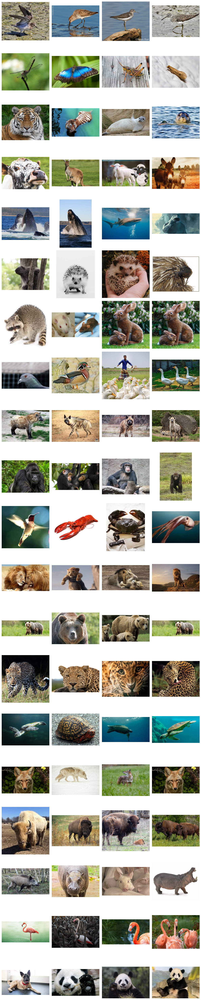

In [81]:
import matplotlib.pyplot as plt
import random

# Add cluster information to the DataFrame
train_df['cluster'] = clusters

# Number of images to display per cluster
images_per_cluster = 4

# Image size and grid layout
img_size = (3, 3)  # Size of each image in inches
n_clusters = len(train_df['cluster'].unique())
fig_width = images_per_cluster * img_size[0]
fig_height = n_clusters * img_size[1]

# Set up the plot
fig, axs = plt.subplots(n_clusters, images_per_cluster, figsize=(fig_width, fig_height))
if n_clusters == 1:  # Handle case for 1 cluster
    axs = [axs]

# Load and display images
for i in range(n_clusters):
    # Select random images from each cluster
    cluster_images = train_df[train_df['cluster'] == i].sample(images_per_cluster, random_state=42)

    for j in range(images_per_cluster):
        ax = axs[i, j] if n_clusters > 1 else axs[j]
        img_path = cluster_images.iloc[j]['path']
        img = plt.imread(img_path)
        ax.imshow(img)
        ax.axis('off')
        if j == 0:
            ax.set_ylabel(f'Cluster {i}', size='small')

plt.tight_layout()
plt.show()


In [82]:
from skimage.transform import resize

# Function to compute the average image of a cluster with resizing
def compute_average_image(cluster_paths, target_size=(64, 64)):
    images = []
    for path in cluster_paths:
        img = plt.imread(path)
        # Resize image to target size
        img_resized = resize(img, target_size, anti_aliasing=True)
        images.append(img_resized)
    return np.mean(images, axis=0)

/var/folders/gh/3mjl00j90dv3s8pd0g3bbyj80000gn/T/ipykernel_6295/3110867146.py:11: DeprecationWarning:

ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.



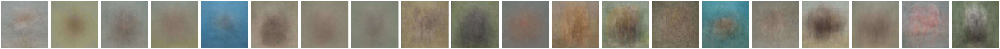

In [83]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def compute_average_image(cluster_paths, target_size=(64, 64)):
    images_sum = None
    count = 0

    for path in cluster_paths:
        img = Image.open(path)
        img_resized = img.resize(target_size, Image.ANTIALIAS)

        if images_sum is None:
            images_sum = np.zeros((target_size[1], target_size[0], 3))

        images_sum += np.array(img_resized)
        count += 1

    average_img = images_sum / count
    return average_img.astype(np.uint8)

# Assuming `n_clusters` is the number of unique clusters and `train_df` has 'path' and 'cluster' columns
n_clusters = train_df['cluster'].nunique()

# Create a subplot for each cluster
fig, axes = plt.subplots(1, n_clusters, figsize=(5 * n_clusters, 5))
if n_clusters == 1:
    axes = [axes]

# Compute and display the average image for each cluster
for cluster_id in range(n_clusters):
    cluster_paths = train_df[train_df['cluster'] == cluster_id]['path'].values
    average_img = compute_average_image(cluster_paths, target_size=(64, 64)) 

    ax = axes[cluster_id] if n_clusters > 1 else axes[0]
    ax.imshow(average_img)
    ax.axis('off')

plt.tight_layout()
plt.show()


In [84]:
# Convert the DataFrame to NumPy array and then flatten the features
train_features_flat = train_features.values.reshape(train_features.shape[0], -1)
test_features_flat = test_features.values.reshape(test_features.shape[0], -1)

In [85]:
# Define the MLP model with the correct input shape
mlp_model = Sequential()
mlp_model.add(Dense(256, input_dim=train_features_flat.shape[1]))  # Adjust input_dim to match the flattened input
mlp_model.add(Dense(128, activation='relu'))
mlp_model.add(Dropout(0.3))
mlp_model.add(Dense(90, activation='softmax'))  # num_classes should be set according to your dataset

# Compile the model
mlp_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model with the flattened data
history = mlp_model.fit(train_features_flat, train_labels, epochs=15, batch_size=60, validation_data=(test_features_flat, test_labels), callbacks=[])


Epoch 1/15
81/81 [==============================] - 1s 3ms/step - loss: 1.6530 - accuracy: 0.7031 - val_loss: 0.3637 - val_accuracy: 0.9019
Epoch 2/15
81/81 [==============================] - 0s 2ms/step - loss: 0.3287 - accuracy: 0.9074 - val_loss: 0.2548 - val_accuracy: 0.9370
Epoch 3/15
81/81 [==============================] - 0s 2ms/step - loss: 0.1909 - accuracy: 0.9461 - val_loss: 0.2400 - val_accuracy: 0.9296
Epoch 4/15
81/81 [==============================] - 0s 2ms/step - loss: 0.1457 - accuracy: 0.9591 - val_loss: 0.2163 - val_accuracy: 0.9333
Epoch 5/15
81/81 [==============================] - 0s 2ms/step - loss: 0.0986 - accuracy: 0.9724 - val_loss: 0.2242 - val_accuracy: 0.9259
Epoch 6/15
81/81 [==============================] - 0s 2ms/step - loss: 0.0779 - accuracy: 0.9774 - val_loss: 0.2048 - val_accuracy: 0.9444
Epoch 7/15
81/81 [==============================] - 0s 2ms/step - loss: 0.0549 - accuracy: 0.9868 - val_loss: 0.2175 - val_accuracy: 0.9315
Epoch 8/15
81/81 [==

In [86]:
# # Evaluate the model on the training data
# train_loss, train_accuracy = mlp_model.evaluate(train_features, train_labels)
# print(f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}') 

# # Evaluate the model on the validation data
# val_loss, val_accuracy = mlp_model.evaluate(validation_generator)
# print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

# # Evaluate the model on the test data
# test_loss, test_accuracy = mlp_model.evaluate(test_features, test_labels)
# print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}')

# Evaluate the model on the flattened training data
train_loss, train_accuracy = mlp_model.evaluate(train_features_flat, train_labels)
print(f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}')

# Evaluate the model on the flattened test data
test_loss, test_accuracy = mlp_model.evaluate(test_features_flat, test_labels)
print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}')


152/152 [==============================] - 0s 708us/step - loss: 0.0092 - accuracy: 0.9965
Train Loss: 0.0092, Train Accuracy: 0.9965
17/17 [==============================] - 0s 709us/step - loss: 0.2423 - accuracy: 0.9370
Test Loss: 0.2423, Test Accuracy: 0.9370


In [87]:
# Make predictions on the training data
mlp_predictions_train = mlp_model.predict(train_features)
mlp_predicted_classes = np.argmax(mlp_predictions_train, axis=1)

# Make predictions on the test data
mlp_predictions_test = mlp_model.predict(test_features)
mlp_predicted_classes = np.argmax(mlp_predictions_test, axis=1)

17/17 [==============================] - 0s 580us/step


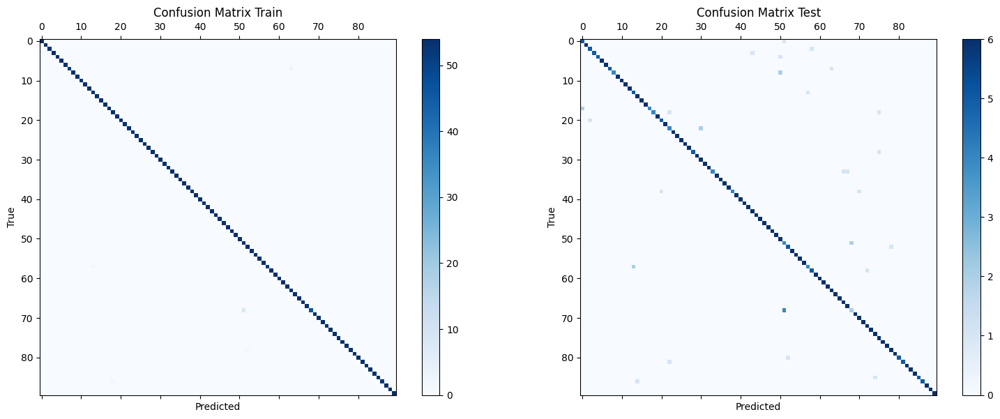

In [88]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Calculate confusion matrices
test_pred = np.argmax(mlp_predictions_test, axis=1)
test_true = np.argmax(test_labels, axis=1)
cm_test = confusion_matrix(test_true, test_pred)

train_pred = np.argmax(mlp_predictions_train, axis=1)
train_true = np.argmax(train_labels, axis=1)
cm_train = confusion_matrix(train_true, train_pred)

# Create a figure for two subplots
fig, (ax2, ax1) = plt.subplots(1, 2, figsize=(16, 6))

# Test Confusion Matrix
ax1.matshow(cm_test, cmap=plt.cm.Blues)
ax1.set_title('Confusion Matrix Test')
ax1.set_xlabel('Predicted')
ax1.set_ylabel('True')
fig.colorbar(ax1.matshow(cm_test, cmap=plt.cm.Blues), ax=ax1)

# Train Confusion Matrix
ax2.matshow(cm_train, cmap=plt.cm.Blues)
ax2.set_title('Confusion Matrix Train')
ax2.set_xlabel('Predicted')
ax2.set_ylabel('True')
fig.colorbar(ax2.matshow(cm_train, cmap=plt.cm.Blues), ax=ax2)

# Adjust layout and display
plt.tight_layout()
plt.show()


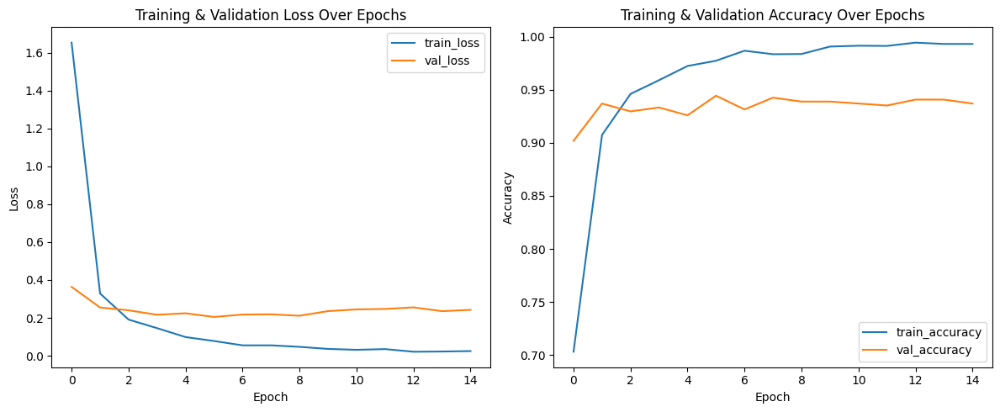

In [89]:
import matplotlib.pyplot as plt

# Assuming 'history' is a variable containing the training history

# Create a figure for two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Plot training & validation loss in the first subplot
ax1.plot(history.history['loss'], label='train_loss')
ax1.plot(history.history['val_loss'], label='val_loss')  # Include validation loss here
ax1.set_title('Training & Validation Loss Over Epochs')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot training & validation accuracy in the second subplot
ax2.plot(history.history['accuracy'], label='train_accuracy')
ax2.plot(history.history['val_accuracy'], label='val_accuracy')  # Include validation accuracy here
ax2.set_title('Training & Validation Accuracy Over Epochs')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Adjust layout and display
plt.tight_layout()
plt.show()
